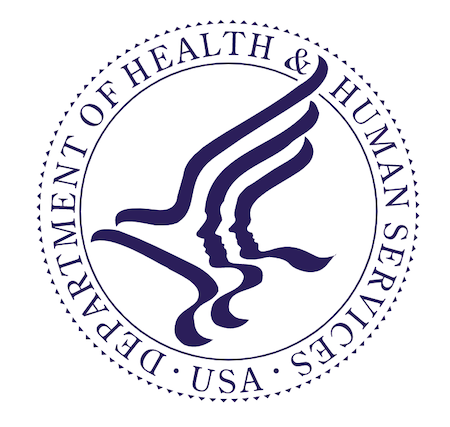

In [37]:

from IPython.display import Image
Image(filename= "prim3.png")


# PRODUCT DATASET
- 162 columns
- 320749 rows
- qualitative and quantitative data

In [38]:
from IPython.display import HTML
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

In [39]:
%config IPCompleter.greedy=True
import pandas as pd
import numpy as nm
import warnings
from bokeh.io import output_file, output_notebook
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource
from bokeh.layouts import row, column, gridplot
from bokeh.models.widgets import Tabs, Panel
import scipy.stats as sst

warnings.filterwarnings("ignore")
data = pd.read_csv("food.csv", delimiter='\t',dtype='unicode')
data.describe()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,320749,320749,320770,320769,320763,320772,320772,303010,52795,104819,...,49,3036,165,948,0,268,221210,221210,0,0
unique,320749,320749,3535,189567,189568,180495,180495,221347,38584,13826,...,25,333,6,84,0,202,55,55,0,0
top,8410813211296,http://world-fr.openfoodfacts.org/produit/4006...,usda-ndb-import,1489055829,2017-03-09T10:37:09Z,1439141742,2015-08-09T17:35:42Z,Ice Cream,Pâtes alimentaires au blé dur de qualité supér...,500 g,...,7.2,0,15,30,NaN,0,0,0,NaN,NaN
freq,1,1,169868,20,20,33,33,410,201,4669,...,9,962,97,150,NaN,20,12763,13588,NaN,NaN


In [40]:
def filterSet(data,term):
    ##selecting right columns
    data1= data.filter(regex=term)
    ##removing all rows without values
    data1.dropna(axis = 0, how = 'all', inplace = True)
    ##if column contains less than 1000 observations remove it
    dropColumns(data1,1000)
    return data1

In [41]:
def dropColumns(data,count):
    for column in data:
        if data[column].count()<=1000:
            del data[column]
    return data

In [42]:
def testDropColumn(data,count):
    print("Dataset has "+str(len(data.columns))+" columns before removal")
    data1=dropColumns(data,count)
    data2=data.dropna(thresh=count,how='all',axis=1)
    if(len(data1.columns)==len(data2.columns)):
        print( "Test is ok")
    else:
        print("Test did not succeed length by dropna= "+str(len(data2.columns))+" length by function "+ str(len(data2.columns)))
    

### Testing dropColumn() function

In [43]:
testDropColumn(data,1000)

Dataset has 162 columns before removal
Test is ok


In [44]:
def removeDuplicates(data, term):
    data1=data
    ##remove duplicates rows depending on selected column. I use it to delete duplicates for product name
    data1['add']= term
    data1=data1.drop_duplicates(subset='add', keep="first")
    del data1['add']
    return data1

In [45]:
def removeDuplicatesTest(data,term,result):
    res=removeDuplicates(data,term)
    if res.shape[0]==result.shape[0]:
        return "test is OK"
    else: 
        return res.shape[0]

### Testing removeDuplicates function
_comparing test dataframe number of rows after removeDuplicates was called with processed previously dataframe_

In [46]:
duplicated=data.drop_duplicates( subset='product_name',keep="first")
prepared=data.drop('product_name', axis=1)
removeDuplicatesTest(prepared,data['product_name'],duplicated)

'test is OK'

In [75]:
def showData(column,data2):
    import scipy.stats as sst
    ##preprocessing dataset
    data2=filterSet(data,column)
    data2=removeDuplicates(data2,data['product_name'])
    
    ##convert object to float and keep positive values
    data2[data2.columns]=data2[data2.columns].apply(pd.to_numeric, errors='coerce')
    data2=data2.abs()
    
    ##add column with qualitative data
    data2['main_category']=data['main_category']
    data2 = data2[pd.notnull(data2['main_category'])]
    
    ##fill NAN with 0
    data2.fillna(0, inplace=True)
    ##format qualitative column
    data3=data2[data2["main_category"].str.contains('en')]
    data3["main_category"]=data3["main_category"].str[3:]
    
    ##group by product category having count >1600, we want to have groups with 1600 observations
    data4=data3.groupby("main_category").filter(lambda x: len(x) > 1600)
    categories = data4['main_category'].unique()
    groups = []
    ##create list that contains lists observations for each category
    for m in categories:
        groups.append(data4[data4['main_category']==m][column])
        
    ##drawing boxplots
    plt.boxplot(groups,labels=categories,vert=False,showfliers=False )
    plt.title(column)
    plt.xlabel('Measure units')
    plt.ylabel('Food categories')
    plt.show()
    
    
    ##F statistic calculation
    count=0
    sum=0
    ##list with mean for each column
    means=[]
    for i in groups:
        mn=i.mean()
        means.append(mn)
        count+=len(i)
        for u in i:
            sum+=u
    ##Grand mean
    MMean=(sum/count)
    
    ##Estimated sum of squares
    ESS=0
    ##Residual sum of squares
    RSS=0
    ##Degree of freedom TSS
    DfT=count-1
    ##Degree of freedom ESS
    DfE=len(groups)-1
    ##Degree of freedom RSS
    DfR=DfT-DfE
    ccount=0
    for y in means:
        ESS+=(y-MMean)**2*len(groups[ccount])
        for ii in groups[ccount]:
            RSS+=(ii-y)**2
        ccount+=1
    ##Total sum of squares
    TSS=0
    for h in groups:
        for j in h:
            TSS+=(j-MMean)**2
    print("TTS: "+str(TSS)+ " ESS: "+ str(ESS)+ " Cooficient of Determination " +str(ESS/TSS)+ ' RSS '+ str(RSS))
    print("F value : "+str((ESS/DfE)/(RSS/DfR)))
    import scipy.stats as stats
    print("Critical Value: "+str(stats.f.ppf(q=0.99, dfn=ESS/DfE, dfd=RSS/DfR)))
    print("-----------------")
    ##direct calculation using scipy library
    if len(groups)==5:
        print(stats.f_oneway(groups[0],groups[1],groups[2] ,groups[3],groups[4]  ))
        print("----------Testing Assumptions----------------")
        ##print(str(sst.shapiro(groups[0])[1])+" "+str(sst.shapiro(groups[1])[1])+" "+str(sst.shapiro(groups[2])[1])+" "+str(sst.shapiro(groups[3])[1])+" "+str(sst.shapiro(groups[4])[1]))
        ##testing fro normality
        checko=True
        for u in groups:
            if sst.shapiro(u)[1]<0.05:
                checko=False
        if checko ==True:
            print("Normality check with Shapiro test is satisfied")
        else:
            print("Normality check with Shapiro test is not satisfied")
            ##testing for homoskedasticity
        
    print("Homoskedasticity check with Bartlett test: p="+ str(sst.bartlett(groups[0],groups[1],groups[2] ,groups[3],groups[4] )[1]))
    

In [48]:
def show2Variab(data):
    ##preproces data
    data2=data
    data2.dropna(axis = 0, how = 'all', inplace = True)
    data2[(data2.T != 0).any()]
    data2[data2.columns]=data2[data2.columns].apply(pd.to_numeric, errors='coerce')
    data2=data2.abs()
    data2.fillna(0, inplace=True)
    ##remove outliers, we remove 1 percent of largest observations 
    return removeOutliers(data2)

In [49]:
def removeOutliers(data2):
    for column in data2:
        q = data2[column].quantile(0.99)
        data2=data2[data2[column] < q]
    return data2

## Analysing quantitative data
_nutrition facts energy and sugars per 100g of various products_

_viewing data on the scatter plot to be able to investigate relationship/ correlation between the variables_

In [50]:
dataa=pd.DataFrame(data, columns = ['energy_100g','sugars_100g'])
dataa=show2Variab(dataa)
dataa.describe()

,energy_100g,sugars_100g
count,255586.000000,255586.000000
mean,1089.035450,14.343520
std,757.493911,19.390884
min,0.000000,0.000000
25%,368.000000,0.770000
50%,1061.500000,4.740000
75%,1648.000000,21.430000
max,3330.000000,87.100000


In [52]:
TOOLS="hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out,box_zoom,undo,redo,reset,tap,save,box_select,poly_select,lasso_select,"

##fig = px.scatter(dataa, x="energy_100g", y="sugars_100g", title="Energy/Sugars")
##fig.show()
p = figure(title="Energy vs Sugars", tools=TOOLS, title_location="above")
p.scatter(dataa["energy_100g"], dataa["sugars_100g"])
p.xaxis[0].axis_label = 'Energy 100g(kcal)'
p.yaxis[0].axis_label = 'Sugars 100g(gr)'
show(p)
output_notebook()

Loading BokehJS ...

_nutrition facts proteins and sugars per 100g of various products_

In [53]:
dataa=pd.DataFrame(data, columns = ['proteins_100g','sugars_100g'])
dataa=show2Variab(dataa)
dataa.describe()

,proteins_100g,sugars_100g
count,255548.000000,255548.000000
mean,6.711843,14.278708
std,7.110106,19.406541
min,0.000000,0.000000
25%,0.700000,0.700000
50%,4.700000,4.645000
75%,10.000000,21.240000
max,33.300000,87.100000


_viewing data on a scatter plot_

In [54]:
##fig = px.scatter(dataa, x="proteins_100g", y="sugars_100g",title='Proteins/Sugars')
##fig.show()

p = figure(title="Proteins vs Sugars", tools=TOOLS, title_location="above")
p.scatter(dataa["proteins_100g"], dataa["sugars_100g"])
p.xaxis[0].axis_label = 'Proteins 100g(gr)'
p.yaxis[0].axis_label = 'Sugars 100g(gr)'
show(p)
output_notebook()

Loading BokehJS ...

_nutrition facts proteins and energy per 100g of various products_

In [55]:
dataa=pd.DataFrame(data, columns = ['proteins_100g','energy_100g'])
dataa=show2Variab(dataa)
dataa.describe()

,proteins_100g,energy_100g
count,255554.000000,255554.000000
mean,6.707933,1087.322246
std,7.105861,756.531137
min,0.000000,0.000000
25%,0.700000,365.125000
50%,4.700000,1063.000000
75%,10.000000,1644.000000
max,33.300000,3330.000000


_viewing data on the scatter plot_

In [56]:
##fig = px.scatter(dataa, x="proteins_100g", y="energy_100g",title='Proteins/Energy')
##fig.show()
p = figure(title="Proteins vs Energy", tools=TOOLS, title_location="above")
p.scatter(dataa["proteins_100g"], dataa["energy_100g"])
p.xaxis[0].axis_label = 'Proteins 100g(gr)'
p.yaxis[0].axis_label = 'Energy 100g(kcal)'
show(p)
output_notebook()

Loading BokehJS ...

# No one scatter plot shows a correlation between the reviewed variables



# Let's review the variation of those nutrition factors related to food category

* present multiple boxplot for each factor according the food category
* group products into the categories that have at least 1600 observations
* run ANOVA test 
* The null hypothesis is simply that the means of the nutrition factor groups are the same
* calculate total sum of squares, residual sum of squares, estimate sum of squares, cooficient of determination
* Calculate F value, critical value

_box plot allows easy snapshot of major descriptive statistics over a chosen data_

#### ANOVA
_the test conducted between one categorical and one quantitative variable\
the purpose to test if the difference between the means within different categories belonging to the categorical variable is statistically significant\
We study if mean of nutition factor quantity per 100g of product is dependent on product category_
##### ANOVA assumptions
* The samples are independent and they do not influence one another.
* The dependent variable should be approximately normally distributed for each category.
* * Testing every group with Shapiro test: h0= samples are coming from normal distribution
* The population standard deviations of the groups are all equal.
* * Testing it with Bartlett test: h0= samples have the same variance. Chose barlett test over levene since it is desined for normally distributed data


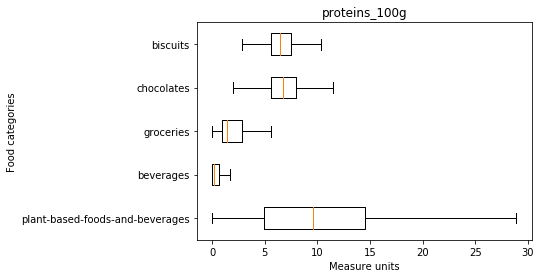

TTS: 288780.6869686178 ESS: 111133.94243731744 Cooficient of Determination 0.3848385555277612 RSS 177646.7445312811
F value : 1403.979290321482
Critical Value: 2.435333499771858
-----------------
F_onewayResult(statistic=1403.9792903214227, pvalue=0.0)
----------Testing Assumptions----------------
Normality check with Shapiro test is not satisfied
Homoskedasticity check with Bartlett test: p=0.0


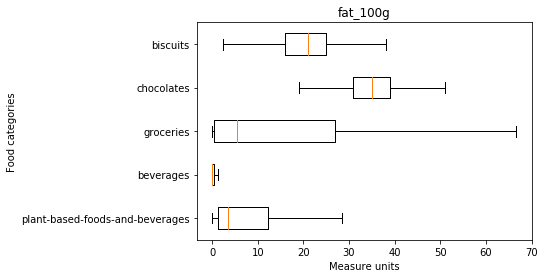

TTS: 2570378.333489809 ESS: 1169889.9616481978 Cooficient of Determination 0.4551430995217872 RSS 1400488.371841583
F value : 1879.5246477106732
Critical Value: 1.324076127073436
-----------------
F_onewayResult(statistic=1879.5246477106796, pvalue=0.0)
----------Testing Assumptions----------------
Normality check with Shapiro test is not satisfied
Homoskedasticity check with Bartlett test: p=0.0


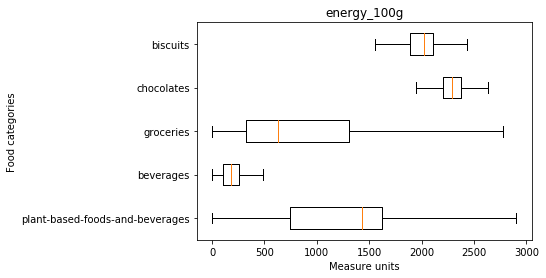

TTS: 7414549636.723727 ESS: 4601584963.428516 Cooficient of Determination 0.6206155719340254 RSS 2812964673.2952104
F value : 3722.7829698462206
Critical Value: 1.0059447389991103
-----------------
F_onewayResult(statistic=3722.7829698462187, pvalue=0.0)
----------Testing Assumptions----------------
Normality check with Shapiro test is not satisfied
Homoskedasticity check with Bartlett test: p=0.0


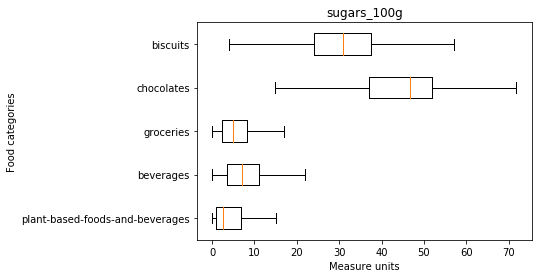

TTS: 3686771.7805228066 ESS: 1655425.3260291668 Cooficient of Determination 0.44901757542323856 RSS 2031346.4544936107
F value : 1746.8237279238967
Critical Value: 1.252037356681281
-----------------
F_onewayResult(statistic=1746.8237279238863, pvalue=0.0)
----------Testing Assumptions----------------
Normality check with Shapiro test is not satisfied
Homoskedasticity check with Bartlett test: p=0.0


In [76]:
showData('proteins_100g',data)
showData('fat_100g',data)
showData('energy_100g',data)
showData('sugars_100g',data)

## Even F statistic and cooficients of determination shows that we could reject null hypotese, the assumptions of homoskedasticity and normality are not satisfied

# Exploratory Analysis

* Principal Component Analysis to reduce the dimentions and but keep variance of the data
* K-mean clustering to group the data and find any patterns

## Available columns that include nutrition facts information


In [58]:
data1= filterSet(data,'100g')
data1=data1.drop(["nutrition-score-uk_100g","nutrition-score-fr_100g"], axis=1)
print(data1.columns)

Index(['energy_100g', 'fat_100g', 'saturated-fat_100g',
       'monounsaturated-fat_100g', 'polyunsaturated-fat_100g',
       'trans-fat_100g', 'cholesterol_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'alcohol_100g', 'vitamin-a_100g', 'vitamin-d_100g',
       'vitamin-e_100g', 'vitamin-c_100g', 'vitamin-b1_100g',
       'vitamin-b2_100g', 'vitamin-pp_100g', 'vitamin-b6_100g',
       'vitamin-b9_100g', 'folates_100g', 'vitamin-b12_100g',
       'pantothenic-acid_100g', 'potassium_100g', 'calcium_100g',
       'phosphorus_100g', 'iron_100g', 'magnesium_100g', 'zinc_100g',
       'copper_100g', 'manganese_100g', 'selenium_100g',
       'fruits-vegetables-nuts_100g'],
      dtype='object')


## Data preprocessing cont
* remove duplicates 
* convert set to float
* drop row if it misses half of the values
* convert negative valuet to positive
* replace NANs with median

In [59]:
data1=removeDuplicates(data1,data['product_name'])

In [60]:
data1[data1.columns]=data1[data1.columns].apply(pd.to_numeric, errors='coerce')


In [61]:
data1.dropna(axis=0, thresh=19, inplace=True)

In [62]:
data1= data1.abs()

In [63]:
data1.fillna(0, inplace=True)


### Variables have different scales so we standardize them to be presented on one scale

In [64]:
from sklearn.preprocessing import StandardScaler
# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(data1)

## Run Principal Component Analysis with 10 components

##### PCA reduces dimentions but saves important information about the data. It allows to understand what factors influence the variance of sample. It combines correlated variables together into principal components. Different components are not correlated but the correlation exists between variables in one component . Because the method studies variation, variables with different scales should be standartised so they can contribute equally to analysis.


In [65]:
from sklearn.decomposition import PCA

num_components = 10
# Create the PCA model
pca = PCA(n_components=num_components)

# Fit the model with the standardised data
pca.fit(X_scaled)
nwD=pca.transform(X_scaled)
pcs = pca.components_ 
pca.explained_variance_ratio_.cumsum()

array([0.11682511, 0.22108015, 0.27940713, 0.33619428, 0.3923261 ,
       0.42968179, 0.46444338, 0.49798755, 0.52917035, 0.55809884])

_plot the cumulative sum of 10 PCs into a scree plot to investigate optimal number of components_
 


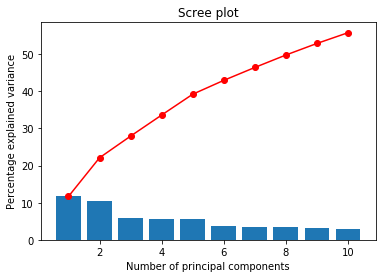

In [66]:
%run functions
display_scree_plot(pca) 

## Review 4 first components in the correlation circle

### Correlation circle of  PC1 and PC2

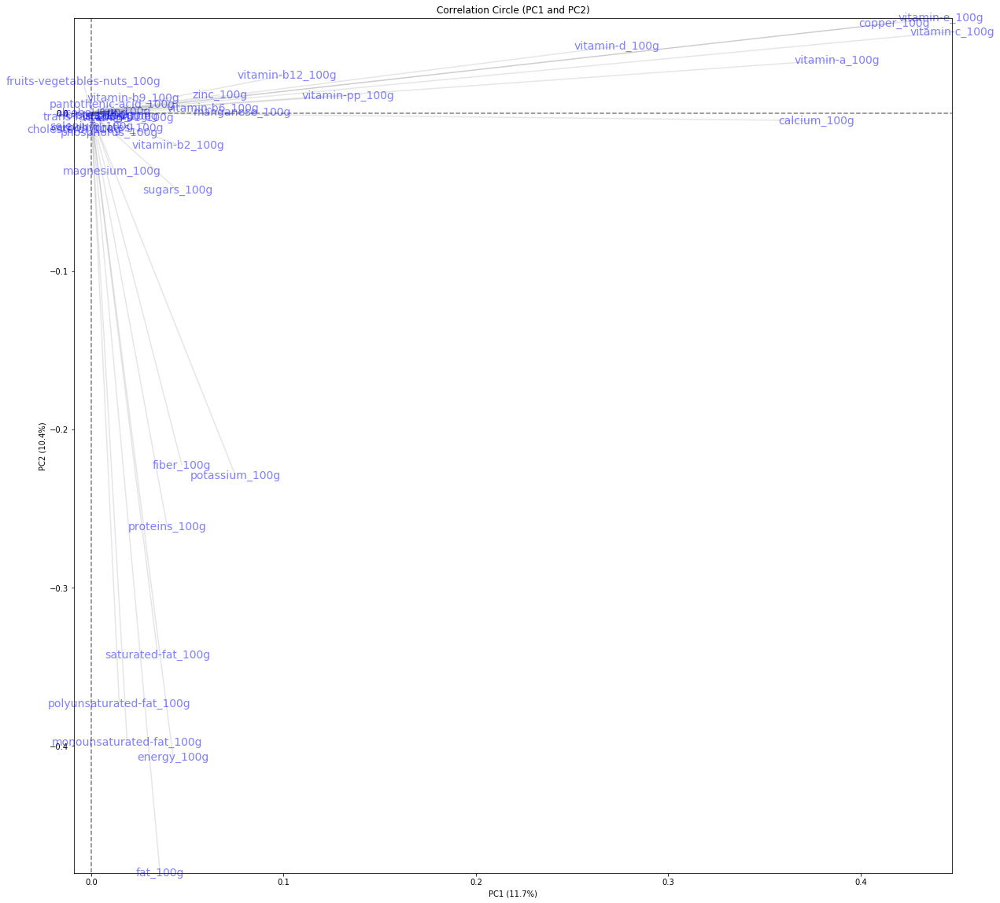

Principal Component1 Presenting Values
    values         factors
17  0.4476  vitamin-c_100g
16  0.4419  vitamin-e_100g
32  0.4173     copper_100g
    values                      factors
6  -0.0088             cholesterol_100g
35 -0.0042  fruits-vegetables-nuts_100g
5  -0.0040               trans-fat_100g
Principal Component2 Presenting Values
    values         factors
16  0.0601  vitamin-e_100g
32  0.0568     copper_100g
17  0.0513  vitamin-c_100g
   values                   factors
1 -0.4803                  fat_100g
0 -0.4072               energy_100g
3 -0.3976  monounsaturated-fat_100g


In [67]:
%run functions
# Generate a correlation circle
pca.components_=np.around(pca.components_, decimals=4)
pcs=pca.components_
display_circles(pcs, num_components, pca, [(0,1)], labels = np.array(data1.columns),)

## PC1: Vitamins
### Vitamis C, E and copper are strongly presented and positively correlated in the first principal component that explians 11% of data variation. No significant negative correlation is found in PC1

## PC2: Fat/Energy
### Fat, monosaturated fat and energy are strongly presented in PC2 that explains additional 10% of data variation. 

# Correlation circle of  PC3 and PC4

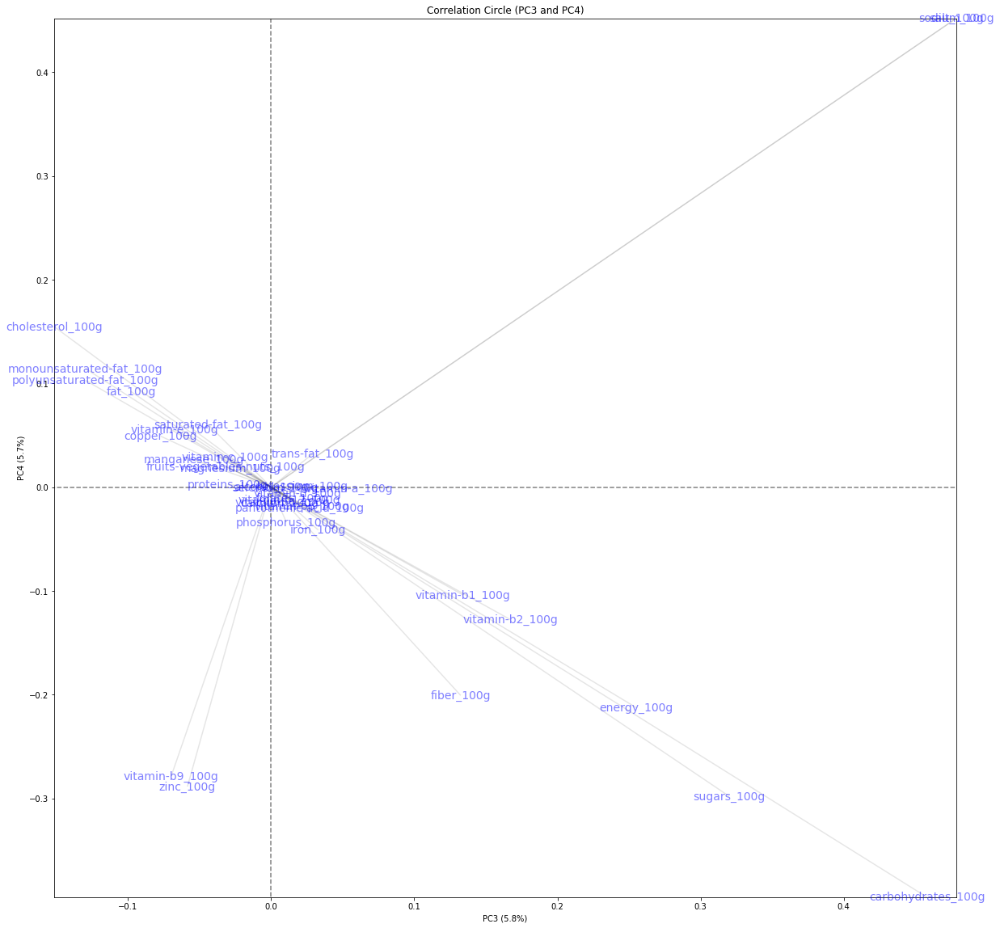

Principal Component3 Presenting Values
    values             factors
12  0.4787         sodium_100g
11  0.4787           salt_100g
7   0.4581  carbohydrates_100g
   values                   factors
6 -0.1516          cholesterol_100g
3 -0.1298  monounsaturated-fat_100g
4 -0.1297  polyunsaturated-fat_100g
Principal Component4 Presenting Values
    values           factors
11  0.4520         salt_100g
12  0.4520       sodium_100g
6   0.1548  cholesterol_100g
    values             factors
7  -0.3951  carbohydrates_100g
8  -0.2979         sugars_100g
31 -0.2886           zinc_100g


In [68]:
display_circles(pcs, num_components, pca, [(2,3)], labels = np.array(data1.columns),)

## PC3: Minerals
### Sodium and salt are positively correlated and highly repserented in PC3, vitamin b9 and zinc are negatively correlated with the above.

## PC4: Diet important elements

### Carbohydrates are negatively correlated with cholesterol in PC4.

In [69]:
num_components=4
pca = PCA(n_components=num_components)
# Fit the model with the standardised data
pca.fit(X_scaled)
nwD=pca.transform(X_scaled)
pcs = pca.components_ 

## For our further analysis we will keep 4 dimentions(PC) that we have reviewed previously to perform clustering and to find some pattern in the data. It explains 33 % of the data variation.

#  K-means algorithm
* used to orginize data in k number of clusters
* places randomly k number of centroid in multidimentional space 
* assignes individals to the closest centroid
* moving centroids to the point that represents mean of individual distances to a centroid
* repeat the process to find clusters with sum of distances to the cluster center

### finding optimal number of clusters with help of elbow curve
#### y axis :
<b>Score</b> - negative sum of distances of samples to their closest cluster center.

In [70]:
principalDf = pd.DataFrame(nwD, columns = range(1,num_components+1))
from sklearn.cluster import KMeans
# Run a number of tests, for 1, 2, ... num_clusters
num_clusters = 9
kmeans_tests = [KMeans(n_clusters=i, init='random', n_init=10) for i in range(1, num_clusters)]
score = [kmeans_tests[i].fit(principalDf).score(principalDf) for i in range(len(kmeans_tests))]

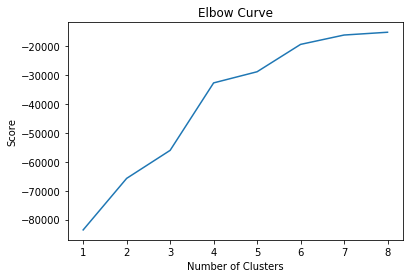

In [71]:
# Plot the curve
plt.plot(range(1, num_clusters),score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

#### 4 clusters looks like optimal number ir gives score of -3000 as within cluster sum

## Running k-mean clustering for 4 n of clusters

In [72]:
# Create a k-means clustering model
kmeans = KMeans(init='random', n_clusters=4, n_init=10)

# Fit the data to the model
kmeans.fit(principalDf)

# Determine which clusters each data point belongs to:
clusters =  kmeans.predict(principalDf)

In [73]:
# Add cluster number to the original data
X_clustered = pd.DataFrame(principalDf, columns=principalDf.columns, index=principalDf.index)
X_clustered['cluster'] = clusters

## Let's review how our 4 reviewed PCs are presented in the different clusters
### clusters created by K-means are spherical and have similar size

_parallel coordinates plots displays presence of different PC in various clusters_

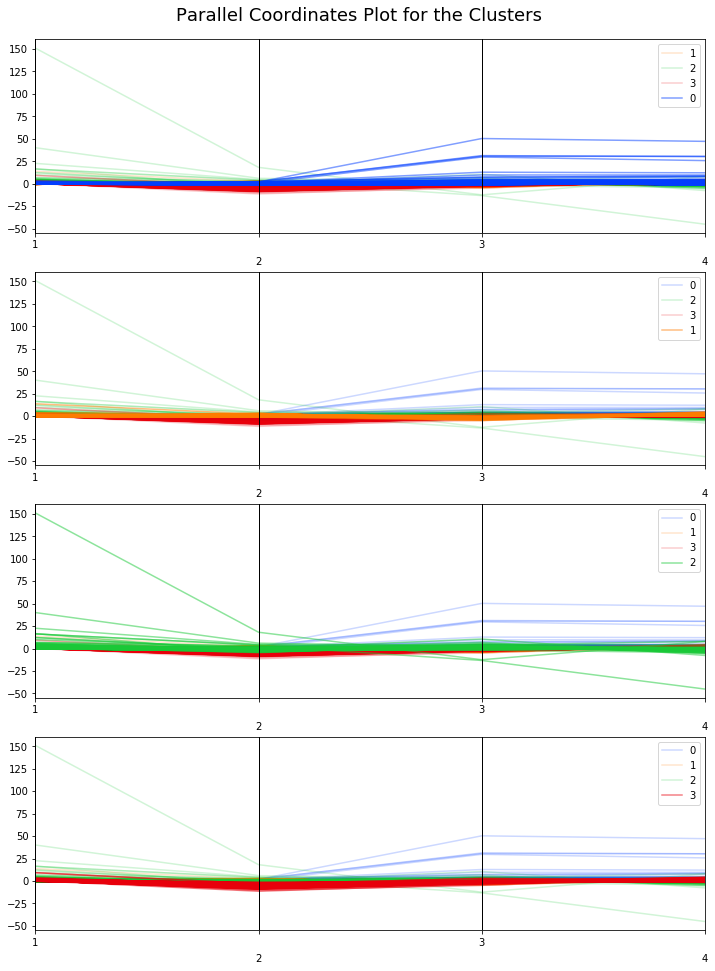

In [74]:
%run functions
# Display parallel coordinates plots, one for each cluster
display_parallel_coordinates(X_clustered, 4)

### The first cluster includes minerals and diet important elements
### The second equaly includes all the different dimentions, however it looks like vitamins are presented more in this cluster
### The third has more vitamins
### The forth sligthly has also more vitamins